/home/wj/anaconda3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


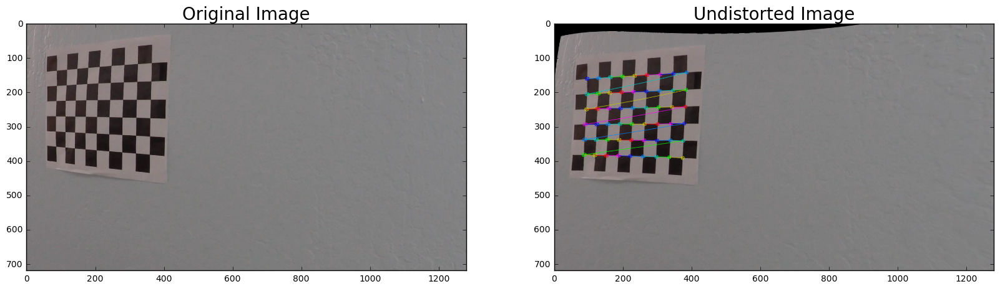

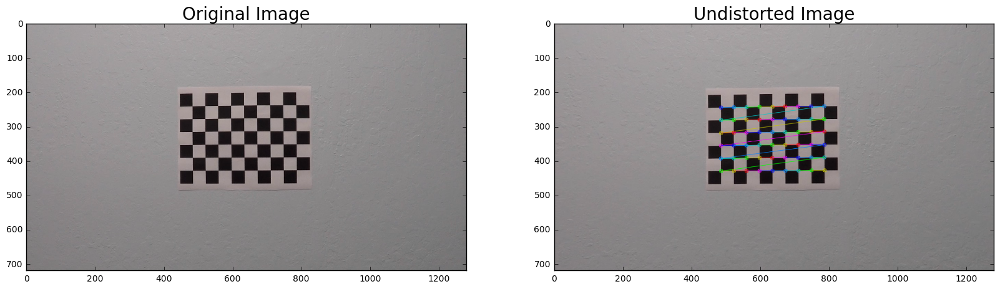

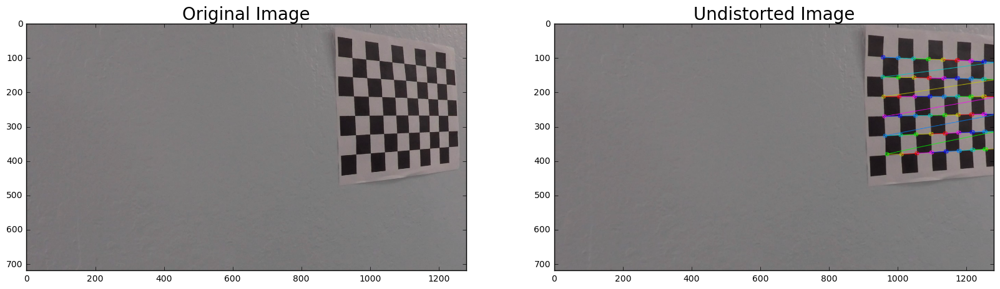

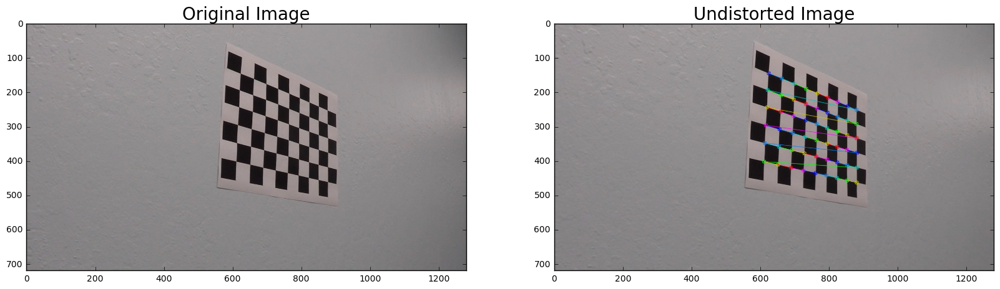

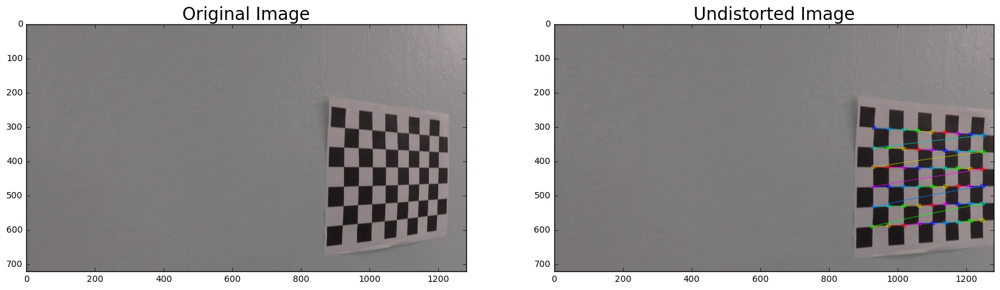

...

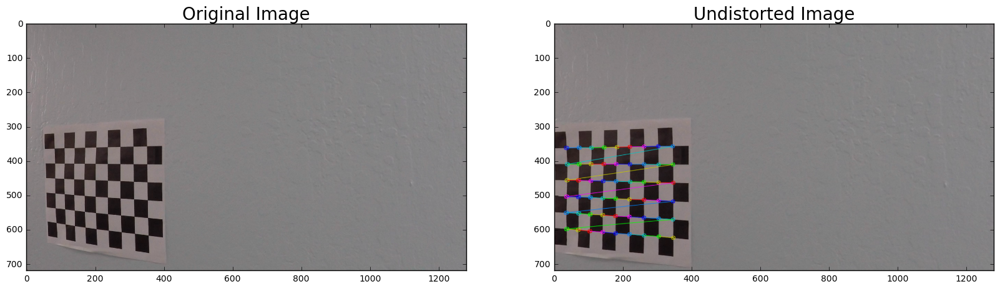

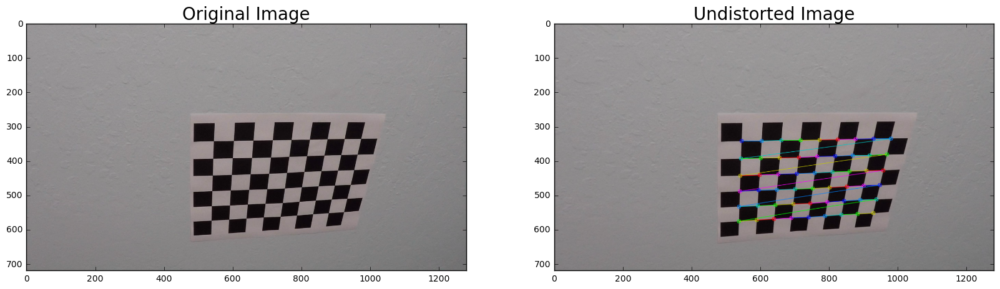

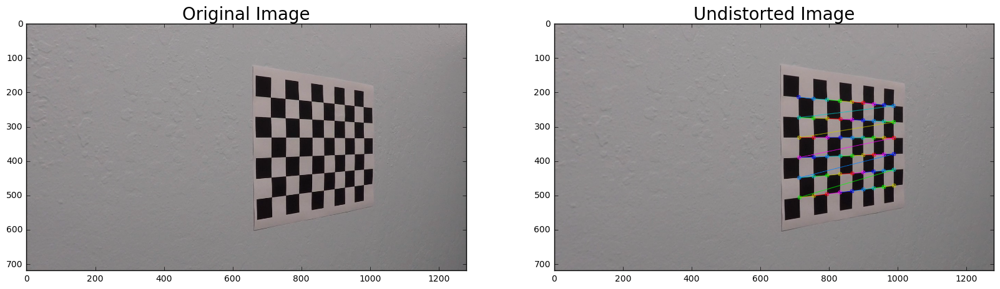

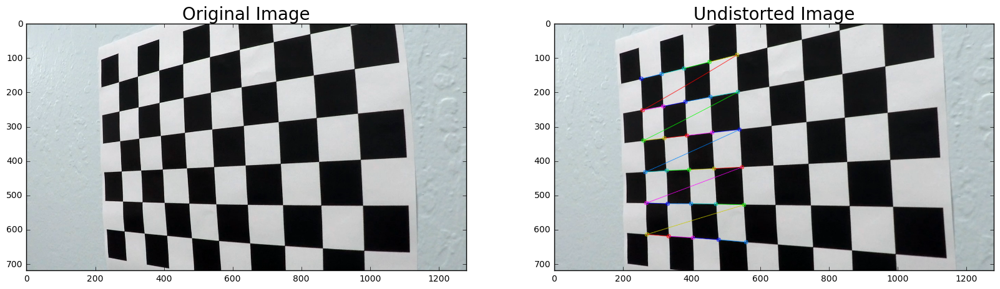

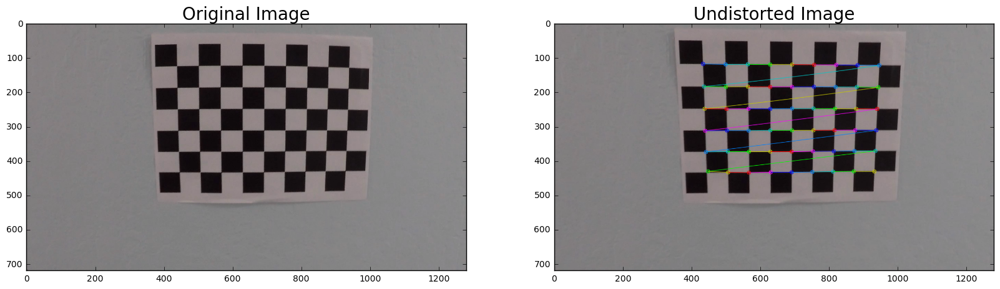

In [16]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import re
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
# all combination dimension
objp1 = np.zeros((6*9, 3), np.float32)
objp1[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)
objp2 = np.zeros((6*8, 3), np.float32)
objp2[:, :2] = np.mgrid[0:8, 0:6].T.reshape(-1, 2)
objp3 = np.zeros((5*9, 3), np.float32)
objp3[:, :2] = np.mgrid[0:9, 0:5].T.reshape(-1, 2)
objp4 = np.zeros((4*9, 3), np.float32)
objp4[:, :2] = np.mgrid[0:9, 0:4].T.reshape(-1, 2)
objp5 = np.zeros((6*7, 3), np.float32)
objp5[:, :2] = np.mgrid[0:7, 0:6].T.reshape(-1, 2)
objp6 = np.zeros((6*5, 3), np.float32)
objp6[:, :2] = np.mgrid[0:5, 0:6].T.reshape(-1, 2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Setup plot
fig = plt.figure(figsize=(20, 10))
w_ratios = [1 for n in range(2)]
h_ratios = [1 for n in range(len(images))]
grid = gridspec.GridSpec(len(images), 2, wspace=0.0, hspace=0.0, width_ratios=w_ratios, height_ratios=h_ratios)
i = 0

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img2 = np.copy(img)
    img_size = (img.shape[1], img.shape[0])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    objp = objp1
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (8, 6), None)
        objp = objp2
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (9, 5), None)
        objp = objp3
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (9, 4), None)
        objp = objp4
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (7, 6), None)
        objp = objp5
    if not ret:
        ret, corners = cv2.findChessboardCorners(gray, (5, 6), None)
        objp = objp6
        
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img2, (corners.shape[1], corners.shape[0]), corners, ret)
        # Do camera calibration given object points and image points
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        dst = cv2.undistort(img2, mtx, dist, None, mtx)
        
        # Visualize undistortion
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=20)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=20)
plt.show()